In [2]:
# Import packages
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.io import fits
from astropy.wcs import WCS

import os, sys
# sys.path.append('/home/jiaxuanl/Research/SALAD/script/')
# import kuaizi
# from kuaizi.display import display_single
# kuaizi.set_env(project='SBF', name='Rosesim', data_dir='/scratch/gpfs/JENNYG/jiaxuanl/Data')
# kuaizi.set_matplotlib(style='JL', usetex=True, fontsize=18, figsize=(7, 5), dpi=90)

# sys.path.append('/home/jiaxuanl/Research/SALAD/script/')
sys.path.append('/home/jiaxuanl/Research/Packages/romanisim/')
os.chdir('/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/')

In [3]:
import asdf
from astroquery.gaia import Gaia
from astropy.coordinates import SkyCoord
from astropy.time import Time
from astropy.table import Table, vstack, Column, hstack
from astropy import units as u
from astropy.visualization import simple_norm
import copy
import galsim
import roman_datamodels as rdm
from romanisim import gaia, bandpass, catalog, log, wcs, persistence, parameters, ris_make_utils as ris
from romanisim.image import inject_sources_into_l2
from romanisim.l3 import inject_sources_into_l3

The archive is unstable and may perform below expectations. Please avoid launching intense Python query showers. Please contact the Gaia helpdesk in case of questions (https://www.cosmos.esa.int/web/gaia/gaia-helpdesk). Workaround solutions for the issues following the recent infrastructure upgrade: https://www.cosmos.esa.int/web/gaia/news#WorkaroundArchive


In [4]:
import os
os.environ['NUMEXPR_MAX_THREADS'] = "30"
os.environ['ROSESIM_DATA_PATH'] = "/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/"
import artpop
import rosesim
from rosesim.display import show_image_wcs
from rosesim.rose import RomanGalaxy, RomanSky
rng = np.random.RandomState(100)

## Now we already have a sky. How to include the sky into RomanGal??

In [48]:
# obs_ra = 150.1049 #270.95
# obs_dec = 2.2741 # -0.2

# obs_ra, obs_dec = 11.8880580, -25.2888000 # NGC 253

obs_ra, obs_dec = 150, 0
# obs_ra, obs_dec = 201.3704160, -43.0166667 # Cen A

# obs_ra, obs_dec = 150.0763360, 2.3118682
# obs_ra, obs_dec = 150.1309765, 2.2994452
# obs_dec = 2.2832743

## Now load a Roman galaxy

In [5]:
dist_arr = np.array([
    3.53, 9.5, 3.5, 8.58, 4.8, 6.72, 9.2, 6.7, 9.1, 8.9,
    7.52, 3.45, 3.58, 4.0, 9.04, 9.75, 9.3, 7.9, 7.08, 7.5
])

(array([5., 0., 1., 0., 0., 3., 2., 1., 4., 4.]),
 array([3.45, 4.08, 4.71, 5.34, 5.97, 6.6 , 7.23, 7.86, 8.49, 9.12, 9.75]),
 <BarContainer object of 10 artists>)

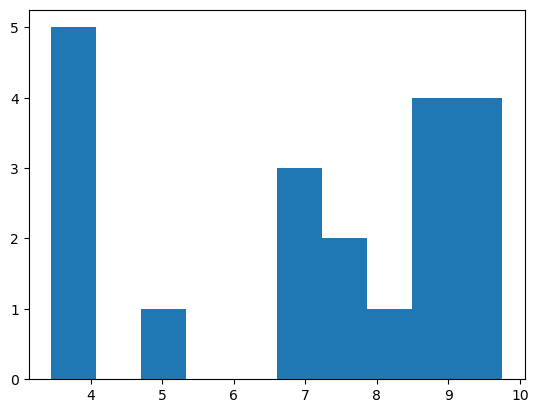

In [6]:
plt.hist(dist_arr)

In [7]:
DATA_PATH = rosesim.DATA_PATH

In [19]:
rng = np.random.RandomState(100)
log_m_star = 4.7
gal_kwargs = {'age': (10**9.8) * u.yr,
              'feh': -1.5,
              'total_mass': 10**log_m_star,
              'r_eff': 80 * u.pc, #10**rosesim.mass_size_carlsten(log_m_star) / 1000 * u.kpc,
              'distance': 1.5 * u.Mpc}

gal = RomanGalaxy(prefix=f'dw_1e{log_m_star:.1f}_{gal_kwargs["distance"].to(u.Mpc).value:.1f}Mpc_age{np.log10(gal_kwargs["age"].value):.1f}_feh{gal_kwargs["feh"]:.1f}', data_dir=DATA_PATH)

reff = (gal_kwargs['r_eff'] / gal_kwargs['distance']).cgs.value * 206265
print('R_eff [arcsec]', reff)
print('15 R_eff [pix]', reff / 0.11 * 15)
s = int(reff / rosesim.pixel_scale * 15)
s = s + (s+1) % 2
# s = 4095
# s = 1025
s = 2049

dmod = 5 * np.log10(gal_kwargs['distance'].value) + 25
abs_mag_lim = 2
mag_lim = dmod + abs_mag_lim
print('mag lim', mag_lim)

R_eff [arcsec] 11.0008
15 R_eff [pix] 1500.1090909090908
mag lim 27.880456295278407


In [9]:
dmod

np.float64(25.880456295278407)

In [20]:
iso = artpop.Isochrone.from_parsec(os.path.join(os.environ['ROSESIM_DATA_PATH'], 'PARSEC/PARSEC_v1.2S_Roman_vega_nTP20.dat'),
                                   log_age=np.log10(gal_kwargs['age'].to(u.yr).value), MH=gal_kwargs['feh'])
iso.mag_table.rename_columns(iso.filters, [item.replace('mag', '') for item in iso.filters])

sp = artpop.SSP(iso, total_mass=gal_kwargs['total_mass'],
                distance=gal_kwargs['distance'],
                mag_limit=mag_lim, mag_limit_band='F158',
                random_state=rng)

src = artpop.SersicSP(sp, n=0.8, theta=10 * u.deg, ellip=0.3,
                     r_eff=gal_kwargs['r_eff'], xy_dim=s, 
                     pixel_scale=rosesim.pixel_scale)

print('# of stars', src.num_stars)
print('Sampled mass fraction:', src.sp.sampled_mass / src.sp.total_mass)
# convert Vega to AB
for filt in src.mags.colnames:
    src.mags[filt] += rosesim.Roman_zp_AB_Vega_parsec[filt]

print('Total mag from stars', -2.5 * np.log10(np.sum(10**(-0.4 * src.mags['F158']))))
print('Total mag fron smooth', src.sp.mag_integrated_component('F158'))
print('SB of smooth', src.sp.mag_integrated_component('F158') + 2.5 * np.log10(2 * np.pi * src.smooth_model.r_eff.value**2 * 0.11**2))

        Use numpy.iterable() instead. [artpop.util]
2026-03-13 22:25:41 WARNING  AstropyDeprecationWarning: The isiterable function is deprecated and may be removed in a future version.
        Use numpy.iterable() instead.


        Use numpy.iterable() instead. [artpop.util]
2026-03-13 22:25:41 WARNING  AstropyDeprecationWarning: The isiterable function is deprecated and may be removed in a future version.
        Use numpy.iterable() instead.


# of stars 605
Sampled mass fraction: 0.011435251384659404
Total mag from stars 18.612461487899907
Total mag fron smooth 18.929841552989448
SB of smooth 26.132410527389467


(-1.0, 1.5)

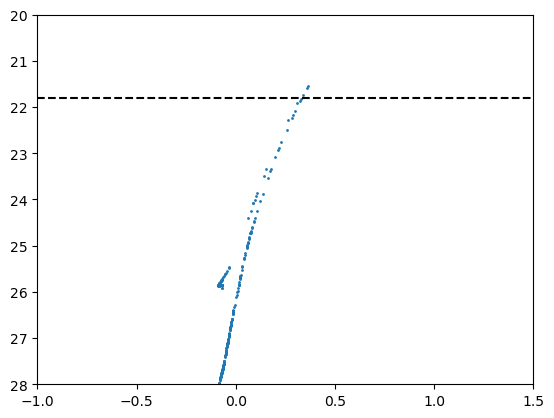

In [47]:
plt.scatter(src.mags['F106'] - src.mags['F158'], src.mags['F158'], s=1)

plt.axhline(-5.4 + sp.dist_mod + rosesim.Roman_zp_AB_Vega_parsec['F158'], ls='--', c='k')
plt.ylim(28, 20)
plt.xlim(-1, 1.5)

In [12]:
# src.sp.sbf_mag('F158') - dmod + rosesim.Roman_zp_AB_Vega_parsec['F158'], src.sp.sbf_mag('F129') - dmod + rosesim.Roman_zp_AB_Vega_parsec['F129']

In [12]:
from galsim import roman
import warnings
from copy import deepcopy
import astrocut
from astrocut import get_center_pixel, ASDFCutout
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
from astropy.nddata import Cutout2D

In [127]:
w = gal.roman_wcs

In [132]:
w.pixel_to_world_values(512, 512)

(150.0000152777778, 1.5277777778425496e-05)

In [137]:
filt = 'F184'
gal.load_src(src, ra=obs_ra, dec=obs_dec) # the ra, dec of the input galaxy doesn't change with dither
gal.load_bkg(filt, f'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/empty_sky_Roman_300/{filt}_{t_exp}s.asdf')
gal.gen_catalog()

Loaded background from /scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/empty_sky_Roman_300/F184_642s.asdf
Catalogue generated.


In [5]:
from rosesim.utils import make_wcs

In [22]:
gal.load_src(src, ra=obs_ra, dec=obs_dec) # the ra, dec of the input galaxy doesn't change with dither
gal.gen_catalog()

No background image loaded. Using default dummy WCS.
Catalogue generated.


In [45]:
for filt in ['F106']:#, 'F129', 'F158']:
    # t_exp = 7400
    t_exp = 642
    # gal.load_bkg(filt, f'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/empty_sky_Roman_300/{filt}_{t_exp}s.asdf')
    gal.load_bkg(filt, f'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/sky_jaguar_trilegal_Roman_300/{filt}_{t_exp}s.asdf')
    # gal.observe(exptimes=t_exp, psftype='galsim', fastpointsources=True)
    gal.observe(exptimes=t_exp, psftype='epsf', fastpointsources=True)
    gal.dm.save(f'./{filt}_{t_exp}s.asdf')

2026-03-13 22:30:14 INFO     Setting pixscale to match default.


2026-03-13 22:30:14 WARNING  wcs is None; unlikely to get orientation of PSF correct.


2026-03-13 22:30:14 INFO     Creating PSF from CRDS reference type epsf


2026-03-13 22:30:14 WARNING  wcs is None; unlikely to get orientation of PSF correct.


2026-03-13 22:30:14 INFO     Creating PSF from CRDS reference type epsf


2026-03-13 22:30:14 WARNING  wcs is None; unlikely to get orientation of PSF correct.


2026-03-13 22:30:14 INFO     Creating PSF from CRDS reference type epsf


2026-03-13 22:30:14 WARNING  wcs is None; unlikely to get orientation of PSF correct.


2026-03-13 22:30:14 INFO     Creating PSF from CRDS reference type epsf


Loaded background from /scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/sky_jaguar_trilegal_Roman_300/F106_642s.asdf
Cut 0 objects outside of the image.


2026-03-13 22:30:14 INFO     Adding 606 sources to image...


2026-03-13 22:30:20 WARNING  Adding noise to each star individually.


2026-03-13 22:30:20 INFO     Rendered 605 point sources in 0.0616 seconds


2026-03-13 22:30:20 INFO     Rendered 606 total sources in 0.443 seconds


(<Figure size 900x900 with 1 Axes>,
 <Axes: >,
 {'norm': <astropy.visualization.mpl_normalize.ImageNormalize at 0x147d0bbb9cd0>})

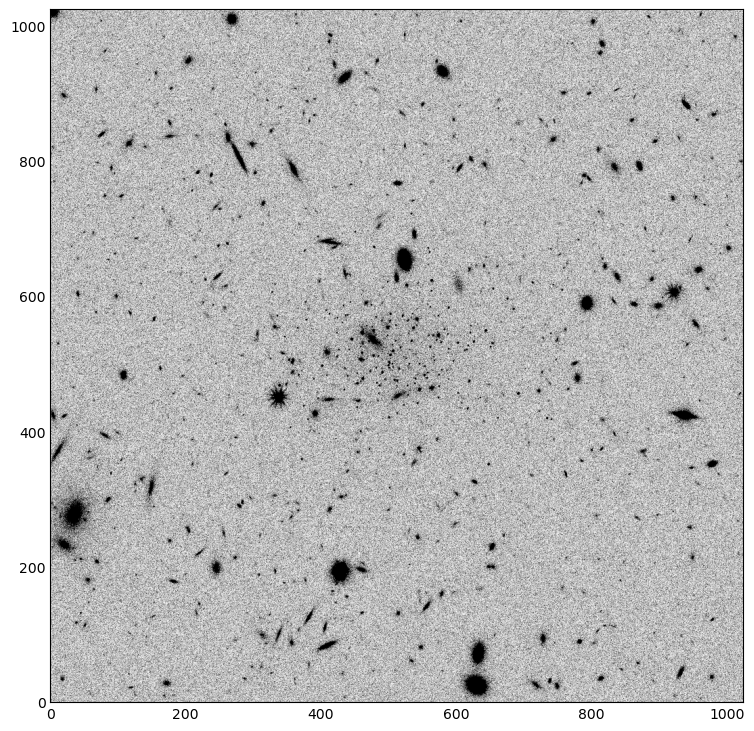

In [46]:
img = gal.dm.data
show_image_wcs(img - np.median(img), cmap='Greys', figsize=(9, 9))

(<Figure size 900x900 with 1 Axes>,
 <Axes: >,
 {'norm': <astropy.visualization.mpl_normalize.ImageNormalize at 0x147d03dfe990>})

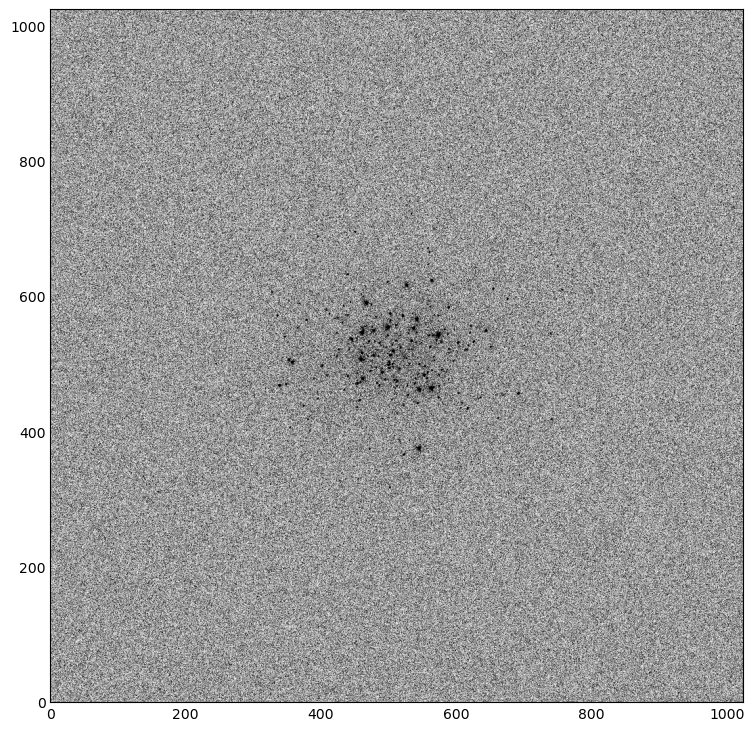

In [24]:
img = gal.dm.data
show_image_wcs(img - np.median(img), cmap='Greys', figsize=(9, 9))

In [319]:
# show_image_wcs(gal.dm.data)

/scratch/gpfs/LSST/stacks/stack_20250106/conda/envs/lsst-scipipe-12.1.0/lib/python3.13/site-packages/numpy/_core/numeric.py:387: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')


(<Figure size 500x500 with 1 Axes>,
 <Axes: >,
 {'norm': <astropy.visualization.mpl_normalize.ImageNormalize at 0x7f2fac0c11d0>})

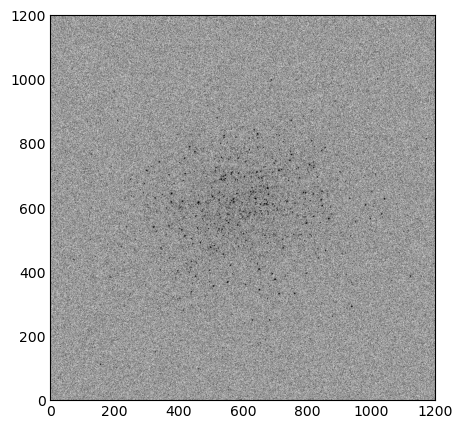

In [33]:
asdf_cutout = ASDFCutout("./F106_642s_temp.asdf", 
                         SkyCoord(obs_ra, obs_dec, unit='deg'), 
                         1200)

img = asdf_cutout.cutouts[0].data 
show_image_wcs(img - np.median(img), cmap='Greys', figsize=(5, 5))

/scratch/gpfs/LSST/stacks/stack_20250106/conda/envs/lsst-scipipe-12.1.0/lib/python3.13/site-packages/numpy/_core/numeric.py:387: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')


(<Figure size 900x900 with 1 Axes>,
 <Axes: >,
 {'norm': <astropy.visualization.mpl_normalize.ImageNormalize at 0x7f59a380eb10>})

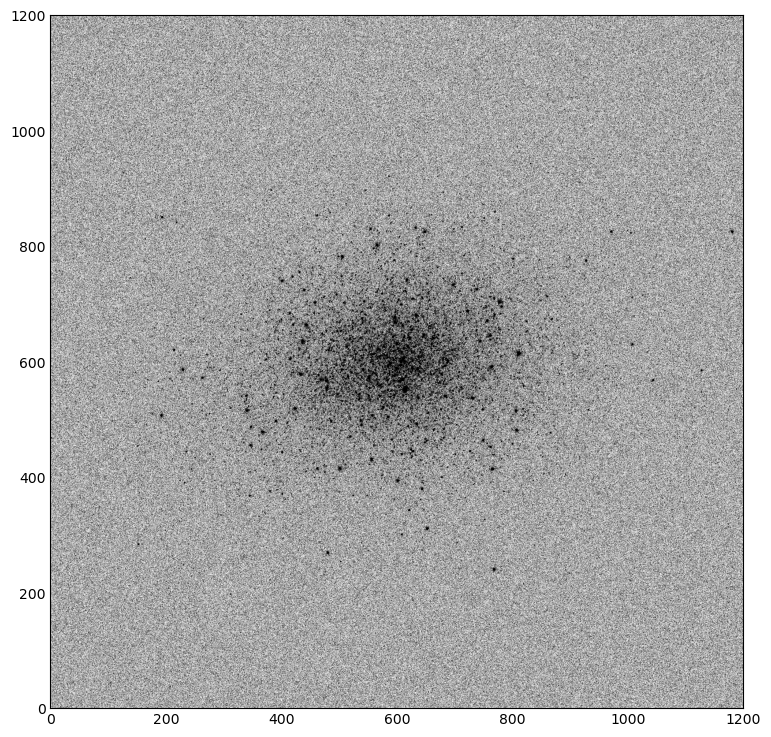

In [39]:
asdf_cutout = ASDFCutout("./F106_600s.asdf", 
                         SkyCoord(obs_ra, obs_dec, unit='deg'), 
                         1200)

img = asdf_cutout.cutouts[0].data 
show_image_wcs(img - np.median(img), cmap='Greys', figsize=(9, 9))

/scratch/gpfs/LSST/stacks/stack_20250106/conda/envs/lsst-scipipe-12.1.0/lib/python3.13/site-packages/numpy/_core/numeric.py:387: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')


(<Figure size 500x500 with 1 Axes>,
 <Axes: >,
 {'norm': <astropy.visualization.mpl_normalize.ImageNormalize at 0x7f1e3ae8c690>})

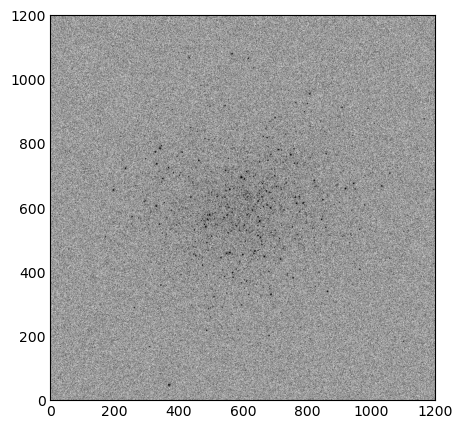

In [329]:
asdf_cutout = ASDFCutout("./F106_642s.asdf", 
                         SkyCoord(obs_ra, obs_dec, unit='deg'), 
                         1200)

img = asdf_cutout.cutouts[0].data 
show_image_wcs(img - np.median(img), cmap='Greys', figsize=(5, 5))

In [45]:
dm = rosesim.read_L3_asdf('./F106_642s.asdf')

In [193]:
rosesim.utils.asdf_to_fits(dm, './test.fits', subtract_bkg=True)

Successfully wrote FITS file: ./test.fits


In [162]:
rosesim.asdf_to_fits(gal.dm, f'{filt}_642s.fits', subtract_bkg=True)

Successfully wrote FITS file: F158_642s.fits


# Visualize

In [5]:
# cen_ra, cen_dec = 11.8880580, -25.2888000 

In [6]:
obs_ra, obs_dec = 150, 0

In [7]:
SkyCoord(obs_ra, obs_dec, unit='deg').galactic

<SkyCoord (Galactic): (l, b) in deg
    (239.10112745, 40.72149273)>

<SkyCoord (Galactic): (l, b) in deg
    (239.10112745, 40.72149273)>

In [8]:
from astropy.visualization import make_lupton_rgb
import sep

zp = -2.5 * np.log10(1 * ((0.11 * u.arcsec)**2).to(u.steradian).value * 1e6 / 3631)
print(zp)

25.265227862373404


25.265227862373404


In [9]:
pwd

'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/dw_1e4.7_1.5Mpc_age9.8_feh-1.5'

'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim'

In [10]:
pwd

'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/dw_1e4.7_1.5Mpc_age9.8_feh-1.5'

'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim'

In [409]:
prefix = 'ufd_1e6_25Mpc_1.0Gyr'
# prefix = 'dw_1e5.5_20Mpc_1.0Gyr'
prefix = 'dw_1e7.0_35Mpc_0.4Gyr'
# prefix = 'ufd_1e3_2Mpc_0.4Gyr'
# prefix = 'dw_1e5.5_2Mpc_2.0Gyr'
prefix = 'dw_1e5.5_2Mpc_age9.6_feh-1.5'
# prefix = 'dw_1e6.0_2Mpc_age9.6_feh-1.5'
# prefix = 'dw_1e4.5_3.0Mpc_age9.6_feh-2.0'
# prefix = 'dw_1e6.0_10.0Mpc_age9.6_feh-2.0'
# prefix = 'dw_1e6.0_2.0Mpc_age9.6_feh-2.0'
prefix = 'dw_1e5.5_2.0Mpc_age9.6_feh-1.5'
prefix = 'TDA_8Mpc_1e6.5Msun'
prefix = 'TucanaB_1.5Mpc_1e4.7Msun'
prefix = 'Roman300_10Mpc_1e5.5Msun_age9.3'
prefix = 'Roman300_5Mpc_1e5Msun_age9.3'

In [410]:
obs_ra, obs_dec = 150, 0

In [411]:
cen_ra, cen_dec = obs_ra, obs_dec
import sep

In [416]:
filters = ['F129', 'F184'] # 'F106', 
imgs = []
# t_exp = 10272
t_exp = 1080
# t_exp = 7400

for filt in filters:
    file = f"/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/{prefix}/{filt}_{t_exp}s.asdf"
    print(file)
    # file = f"/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/sky_jaguar_trilegal_ngc253/{filt}_{t_exp}s.asdf", 
    # file = f"/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/sky_jaguar_trilegal/{filt}_642s.asdf", 
    asdf_cutout = ASDFCutout(file,
                             SkyCoord(cen_ra, cen_dec, unit='deg'), 300) # 5001
    # SkyCoord(obs_ra, obs_dec, unit='deg'), 4069) # 5001
    
    # hdu = asdf_cutout.fits_cutouts[0]
    # img = hdu[0].data.astype(float)
    img = asdf_cutout.cutouts[0].data
    bkg = sep.Background(img, bw=256, bh=256)
    img -= bkg.globalback
    # hdu.writeto(f'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/{prefix}/{filt}_{t_exp}s_cutout.fits', overwrite=True)

    img *= 10**(0.4 * (27 - zp))
    # imgs.append(img[250:1250, :])
    imgs.append(img[:, :])

/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/Roman300_5Mpc_1e5Msun_age9.3/F129_1080s.asdf
/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/Roman300_5Mpc_1e5Msun_age9.3/F184_1080s.asdf


In [417]:
import rosesim

In [418]:
from kuaizi.display import display_single

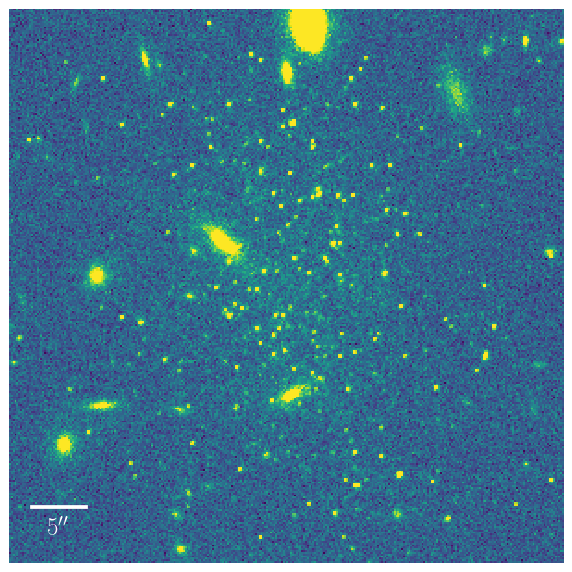

In [419]:
display_single(imgs[0]);

(np.float64(-0.5), np.float64(299.5), np.float64(-0.5), np.float64(299.5))

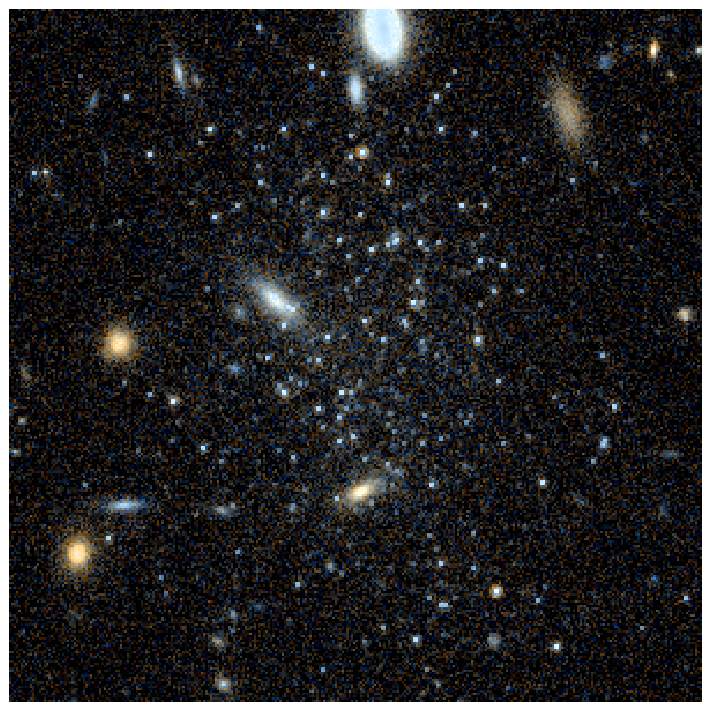

In [420]:
# rgb = make_lupton_rgb(1 * imgs[2], 1.15 * imgs[1], 1.2 * imgs[0], minimum=-0.02, stretch=0.3, Q=3)
rgb = make_lupton_rgb(0.9 * imgs[1], 1.05 * 0.5 * (imgs[1] + imgs[0]), 1.15 * imgs[0], minimum=-0.02, stretch=0.5, Q=3)
# rgb = make_lupton_rgb(0.9 * imgs[2], 1.05 * imgs[1], 1.2 * imgs[0], minimum=0, stretch=0.5, Q=3)
fig, ax = plt.subplots(figsize=(10, 10))
# fig, ax = plt.subplots(figsize=(20, 20))
plt.imshow(rgb) #, origin='lower')
plt.axis('off')

# plt.text(wid - 0.2 * wid, +5, filters[filt_idx[0]], 
         # fontsize=20, color='deepskyblue', va='center', ha='center')
# plt.text(wid, +5, filters[filt_idx[1]], 
         # fontsize=20, color='limegreen', va='center', ha='center')
# plt.text(wid + 0.2 * wid, +5, filters[filt_idx[2]], 
         # fontsize=20, color='orangered', va='center', ha='center')
# title = prefix
# plt.title(title, fontsize=20)

# plt.savefig(f'/tigress/jiaxuanl/public_html/figure/SBF/Rosesim/{prefix}.png', bbox_inches='tight', dpi=200, transparent=True, pad_inches=0)
# plt.close()

In [122]:
cat = Table.read('/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/Roman300_20Mpc_1e6.5Msun_age9.0/temp/pts_table.ecsv')

In [123]:
F129 = -2.5 * np.log10(cat['F129'])
F184 = -2.5 * np.log10(cat['F184'])

(30.0, 20.0)

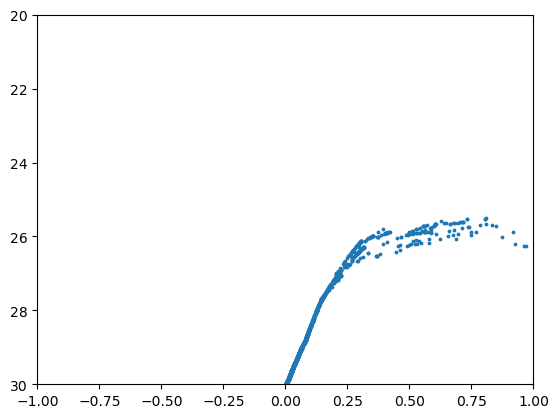

In [125]:
plt.scatter(F129-F184, F129, s=3)
plt.xlim(-1, 1)
plt.ylim(30, 20)

----

## Image gallery

/scratch/gpfs/LSST/stacks/stack_20250106/conda/envs/lsst-scipipe-12.1.0/lib/python3.13/site-packages/numpy/_core/numeric.py:387: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/scratch/gpfs/LSST/stacks/stack_20250106/conda/envs/lsst-scipipe-12.1.0/lib/python3.13/site-packages/numpy/_core/numeric.py:387: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')
/scratch/gpfs/LSST/stacks/stack_20250106/conda/envs/lsst-scipipe-12.1.0/lib/python3.13/site-packages/numpy/_core/numeric.py:387: RuntimeWarning: invalid value encountered in cast
  multiarray.copyto(a, fill_value, casting='unsafe')


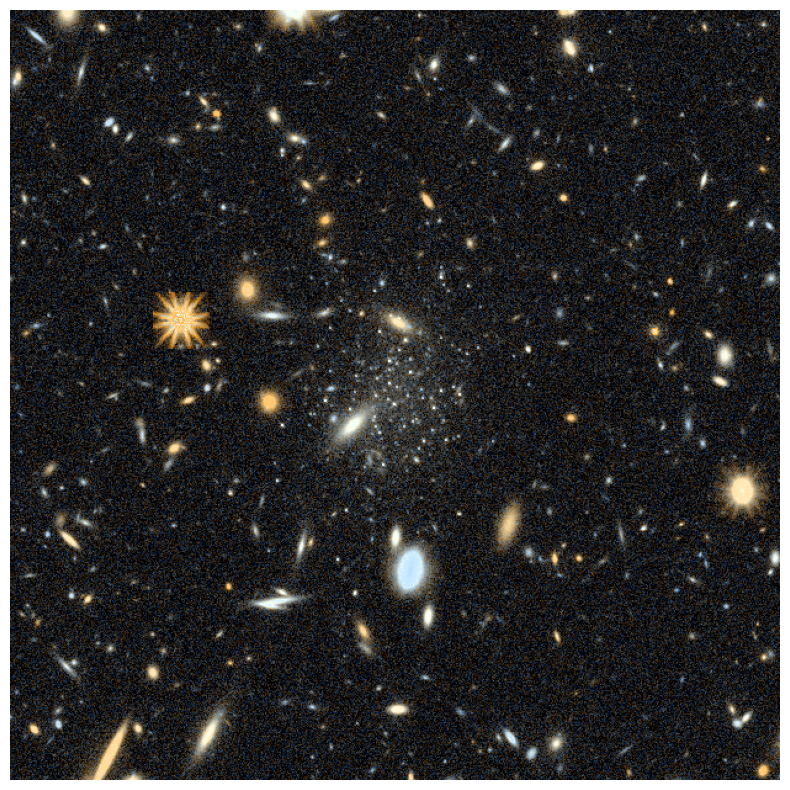

In [21]:
age, feh = 9.8, -1.5
t_exp = 7400
# t_exp = 1080
# t_exp = 642
for mass in [5.5]:
    for dist in [8]:
        prefix = f'TDA_{dist}Mpc_1e{mass:.1f}Msun'
        # prefix = f'Roman300_{dist}Mpc_1e{mass}Msun_age9.3'
        # prefix = f'dw_1e{mass:.1f}_{dist:.1f}Mpc_age{age:.1f}_feh{feh:.1f}'

        filters = ['F106', 'F129', 'F158']
        # filters = ['F129', 'F184']
        imgs = []
        for filt in filters:
            asdf_cutout = ASDFCutout(f"/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/{prefix}/{filt}_{t_exp}s.asdf", 
                                     SkyCoord(obs_ra, obs_dec, unit='deg'), 625)
        
            # hdu = asdf_cutout.fits_cutouts[0]
            # hdu.writeto(f'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/{prefix}/{filt}_{t_exp}s_cutout.fits', overwrite=True)
        
            img = asdf_cutout.cutouts[0].data
            import sep
            bkg = sep.Background(img.astype(float), bw=256, bh=256)
            img -= bkg.globalback
            img *= 10**(0.4 * (27 - zp))
            imgs.append(img[:, :])

        # rgb = make_lupton_rgb(0.9 * imgs[2], 1.05 * imgs[1], 1.2 * imgs[0], minimum=0, stretch=1, Q=3)
        # rgb = make_lupton_rgb(0.95 * imgs[2], 1.15 * imgs[1], 1.2 * imgs[0], minimum=-0.02, stretch=0.2, Q=3)
        rgb = make_lupton_rgb(0.9 * imgs[2], 1.05 * 0.5 * (imgs[2] + imgs[0]), 1.15 * imgs[0], minimum=-0.02, stretch=0.2, Q=3)

        # rgb = make_lupton_rgb(0.9 * imgs[1], 1.05 * 0.5 * (imgs[1] + imgs[0]), 1.15 * imgs[0], minimum=-0.02, stretch=0.5, Q=3)
        fig, ax = plt.subplots(figsize=(10, 10))
        plt.imshow(rgb)
        plt.axis('off')
        # plt.savefig(f'/tigress/jiaxuanl/public_html/figure/SBF/Rosesim/{prefix}.png', bbox_inches='tight', dpi=200, transparent=True)
        # plt.close()

In [22]:
img.shape

(625, 625)

In [406]:
age, feh = 9.8, -1.5
# t_exp = 7400
t_exp = 1080
# t_exp = 642
for mass in [5.5, 5.75, 6.0, 6.25]:
    for dist in [15, 20]:
        # prefix = f'TDA_{dist}Mpc_1e{mass:.1f}Msun'
        prefix = f'Roman300_{dist}Mpc_1e{mass}Msun_age9.3'
        # prefix = f'dw_1e{mass:.1f}_{dist:.1f}Mpc_age{age:.1f}_feh{feh:.1f}'

        filters = ['F106', 'F129', 'F158']
        filters = ['F129', 'F184']
        imgs = []
        for filt in filters:
            asdf_cutout = ASDFCutout(f"/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/{prefix}/{filt}_{t_exp}s.asdf", 
                                     SkyCoord(obs_ra, obs_dec, unit='deg'), 400)
        
            # hdu = asdf_cutout.fits_cutouts[0]
            # hdu.writeto(f'/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/{prefix}/{filt}_{t_exp}s_cutout.fits', overwrite=True)
        
            img = asdf_cutout.cutouts[0].data
            import sep
            bkg = sep.Background(img.astype(float), bw=256, bh=256)
            img -= bkg.globalback
            img *= 10**(0.4 * (27 - zp))
            imgs.append(img[:, :])

        # rgb = make_lupton_rgb(0.9 * imgs[2], 1.05 * imgs[1], 1.2 * imgs[0], minimum=0, stretch=1, Q=3)
        # rgb = make_lupton_rgb(0.95 * imgs[2], 1.15 * imgs[1], 1.2 * imgs[0], minimum=-0.02, stretch=0.2, Q=3)
        # rgb = make_lupton_rgb(0.9 * imgs[2], 1.05 * 0.5 * (imgs[2] + imgs[0]), 1.15 * imgs[0], minimum=-0.02, stretch=0.2, Q=3)

        rgb = make_lupton_rgb(0.9 * imgs[1], 1.05 * 0.5 * (imgs[1] + imgs[0]), 1.15 * imgs[0], minimum=-0.02, stretch=0.5, Q=3)
        fig, ax = plt.subplots(figsize=(10, 10))
        plt.imshow(rgb)
        plt.axis('off')
        plt.savefig(f'/tigress/jiaxuanl/public_html/figure/SBF/Rosesim/{prefix}.png', bbox_inches='tight', dpi=200, transparent=True)
        plt.close()

In [398]:
import kuaizi
kuaizi.set_matplotlib(style='JL', usetex=True, fontsize=18, figsize=(7, 5), dpi=90)

In [399]:
from PIL import Image

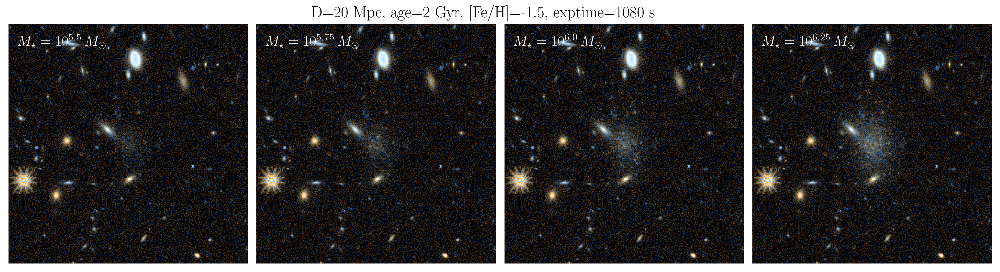

In [408]:
fig, axes = plt.subplots(1, 4, figsize=(4*6, 1*6), dpi=200)
# for ax in axes.flatten():
    # ax.axis('off')

t_exp = 1080
for i, mass in enumerate([5.5, 5.75, 6.0, 6.25]):
    for j, dist in enumerate([20]):
        prefix = f'Roman300_{dist}Mpc_1e{mass}Msun_age9.3'
        # prefix = f'dw_1e{mass:.1f}_{dist:.1f}Mpc_age{age:.1f}_feh{feh:.1f}'
        file = f'/tigress/jiaxuanl/public_html/figure/SBF/Rosesim/{prefix}.png'

        ax = axes[i]
        image = Image.open(file)
        ax.imshow(image, origin='upper')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.axis('off')
        ax.text(0.05, 0.90, r'$M_\star = 10^{' + f'{mass}' + r'}\, M_\odot$', transform=ax.transAxes, 
                ha='left', color='white', fontsize=20)
        # ax.text(0.95, 0.85, f'{obj['stage']}', transform=ax.transAxes, ha='right', color='w', fontsize=12)
        # ax.text(0.95, 0.05, f'z={obj['z']:.4f}', transform=ax.transAxes, ha='right', color='w', fontsize=10)

# axes[0].set_ylabel('10 Mpc', color='k')
plt.suptitle(f'D={dist} Mpc, age=2 Gyr, [Fe/H]=-1.5, exptime=1080 s', y=0.93)
plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.savefig(f'/tigress/jiaxuanl/public_html/figure/SBF/Rosesim/15mpc_Roman300_dwarfs.png', bbox_inches='tight', transparent=True, dpi=200)

In [ ]:
D = [5, 10, 15, 20]
mass = [5.2, 5.5, 5.75, 6.0]

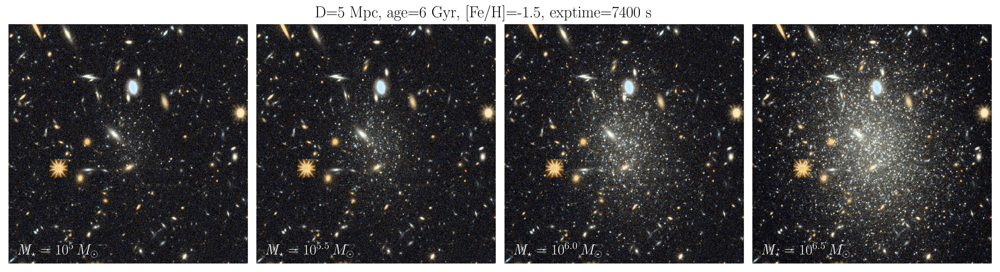

In [76]:
fig, axes = plt.subplots(1, 4, figsize=(4*6, 1*6), dpi=200)
# for ax in axes.flatten():
    # ax.axis('off')
for i, mass in enumerate([5, 5.5, 6.0, 6.5]):
    for j, dist in enumerate([5]):
        prefix = f'TDA_{dist}Mpc_1e{mass:.1f}Msun'
        # prefix = f'dw_1e{mass:.1f}_{dist:.1f}Mpc_age{age:.1f}_feh{feh:.1f}'
        file = f'/tigress/jiaxuanl/public_html/figure/SBF/Rosesim/{prefix}.png'

        ax = axes[i]
        image = Image.open(file)
        ax.imshow(image, origin='upper')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.axis('off')
        ax.text(0.05, 0.05, r'$M_\star = 10^{' + f'{mass}' + r'}\, M_\odot$', transform=ax.transAxes, 
                ha='left', color='white', fontsize=20)
        # ax.text(0.95, 0.85, f'{obj['stage']}', transform=ax.transAxes, ha='right', color='w', fontsize=12)
        # ax.text(0.95, 0.05, f'z={obj['z']:.4f}', transform=ax.transAxes, ha='right', color='w', fontsize=10)

# axes[0].set_ylabel('10 Mpc', color='k')
plt.suptitle('D=5 Mpc, age=6 Gyr, [Fe/H]=-1.5, exptime=7400 s', y=0.93)
plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.savefig(f'/tigress/jiaxuanl/public_html/figure/SBF/Rosesim/5mpc_TDA_dwarfs.png', bbox_inches='tight', transparent=True, dpi=200)

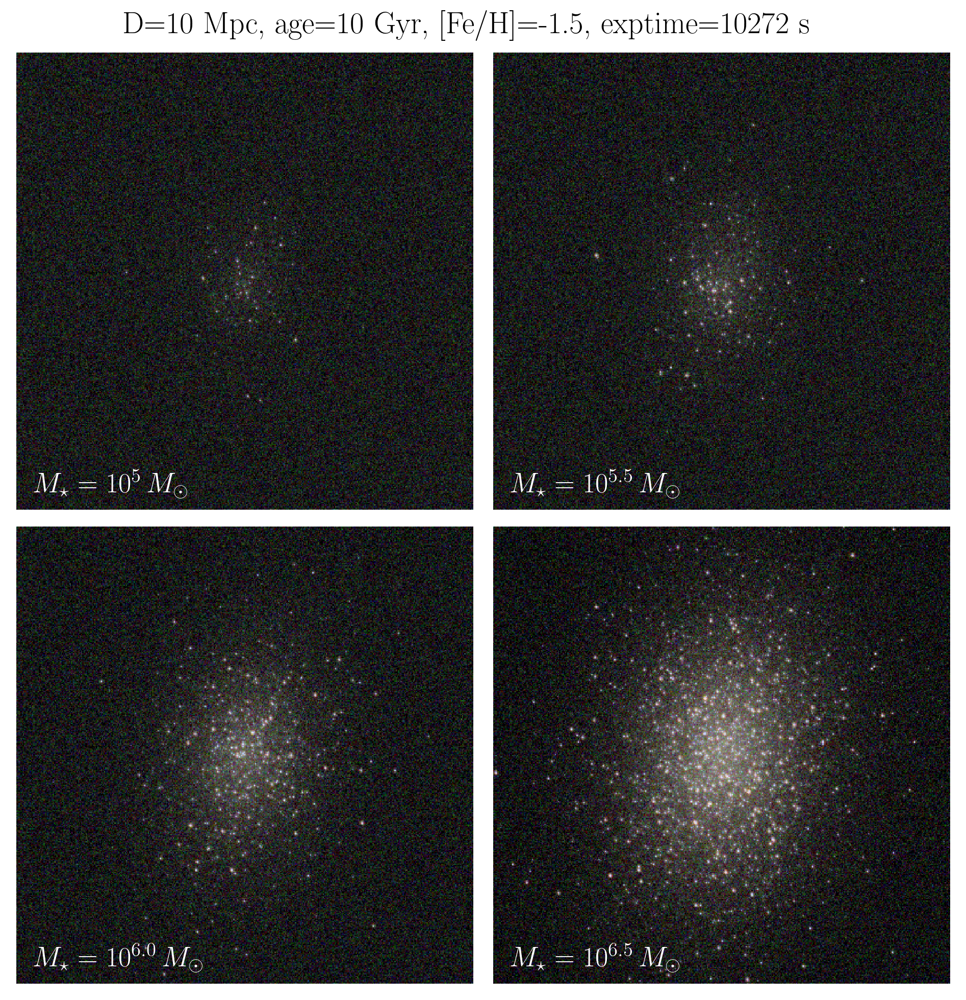

In [141]:
fig, axes = plt.subplots(2, 2, figsize=(2*6, 2*6), dpi=200)
# for ax in axes.flatten():
    # ax.axis('off')
for i, mass in enumerate([5, 5.5, 6.0, 6.5]):
    for j, dist in enumerate([10]):
        prefix = f'dw_1e{mass:.1f}_{dist:.1f}Mpc_age{age:.1f}_feh{feh:.1f}'
        file = f'/tigress/jiaxuanl/public_html/figure/SBF/Rosesim/{prefix}.png'

        ax = axes[i//2, i%2]
        image = Image.open(file)
        ax.imshow(image, origin='upper')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.axis('off')
        ax.text(0.05, 0.05, r'$M_\star = 10^{' + f'{mass}' + r'}\, M_\odot$', transform=ax.transAxes, 
                ha='left', color='white', fontsize=20)
        # ax.text(0.95, 0.85, f'{obj['stage']}', transform=ax.transAxes, ha='right', color='w', fontsize=12)
        # ax.text(0.95, 0.05, f'z={obj['z']:.4f}', transform=ax.transAxes, ha='right', color='w', fontsize=10)

# axes[0].set_ylabel('10 Mpc', color='k')
plt.suptitle('D=10 Mpc, age=10 Gyr, [Fe/H]=-1.5, exptime=10272 s', y=0.91)
plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.savefig(f'/tigress/jiaxuanl/public_html/figure/SBF/Rosesim/10mpc_dwarfs.png', bbox_inches='tight', transparent=True, dpi=200)

In [84]:
zp = -2.5 * np.log10(1 * ((0.11 * u.arcsec)**2).to(u.steradian).value * 1e6 / 3631)
print(zp)

25.265227862373404


In [90]:
filters = ['F106', 'F129', 'F158']
imgs = []
t_exp = 7400
bkg_prefix = 'sky_jaguar_trilegal_TDA'

t_exp = 642
bkg_prefix = 'sky_jaguar_trilegal_Roman_300'
for filt in filters:
    
    file = f"/scratch/gpfs/JENNYG/jiaxuanl/Data/SBF/Rosesim/{bkg_prefix}/{filt}_{t_exp}s.asdf", 
    asdf_cutout = ASDFCutout(file,
                             SkyCoord(cen_ra, cen_dec, unit='deg'), 1023) 
    img = asdf_cutout.cutouts[0].data
    bkg = sep.Background(img, bw=256, bh=256)
    img -= bkg.globalback
    img *= 10**(0.4 * (27 - zp))
    imgs.append(img[:, :])

(np.float64(-0.5), np.float64(1022.5), np.float64(-0.5), np.float64(1022.5))

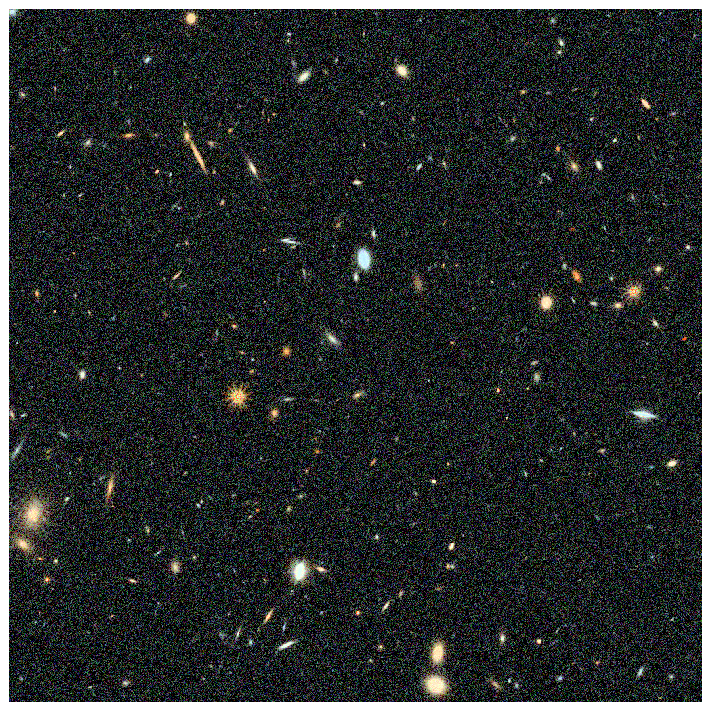

In [92]:
rgb = make_lupton_rgb(0.95 * imgs[2], 1.15 * imgs[1], 1.2 * imgs[0], minimum=-0.03, stretch=0.5, Q=3)
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(rgb)
plt.axis('off')